In [1]:
%cd MultiModel

/workspace/MultiModel


/miniconda/envs/mm/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
import cv2
import numpy as np
import os
import pandas as pd

# =========================================================================
# === 參數設定與函式定義 ===================================================
# =========================================================================

# --- 圖片路徑和列表設定 ---
DARK_BASE_PATH = 'eval15/low' # 低光圖的資料夾路徑
IMAGE_FILENAMES = [
    '1.png', '111.png', '146.png', '179.png', '22.png', 
    '23.png', '493.png', '547.png', '55.png', '665.png', 
    '669.png', '748.png', '778.png', '780.png', '79.png'
]

def quantify_mean_brightness(img_bgr):
    """
    計算圖像的平均亮度百分比。
    使用灰階平均值，並標準化到 0% 到 100% 範圍。
    """
    
    # 1. 轉換為灰階 (Luminance)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # 2. 計算平均像素強度 (0-255)
    mean_intensity = np.mean(img_gray)
    
    # 3. 標準化為百分比
    # 8-bit 圖像的最大值為 255
    brightness_percentage = (mean_intensity / 255.0) * 100
    
    return mean_intensity, brightness_percentage

# =========================================================================
# === 主運行區塊 ===========================================================
# =========================================================================

if __name__ == '__main__':
    all_brightness_results = []
    
    print(f"--- 📊 開始分析 {len(IMAGE_FILENAMES)} 張低光圖像的平均亮度 ---")
    
    for filename in IMAGE_FILENAMES:
        image_path = os.path.join(DARK_BASE_PATH, filename)
        img_bgr = cv2.imread(image_path)
        
        if img_bgr is not None:
            mean_value, percentage = quantify_mean_brightness(img_bgr)
            
            # 儲存結果
            all_brightness_results.append({
                "Filename": filename,
                "Mean Pixel Value (0-255)": mean_value,
                "Avg. Brightness (%)": percentage
            })
            
            print(f"[{filename:<10}] 平均亮度: {percentage:.2f}% (像素值: {mean_value:.2f})")
            
        else:
            print(f"錯誤：無法載入圖片 {filename}。請檢查路徑。")

    # 4. 彙整並輸出最終表格
    if all_brightness_results:
        results_df = pd.DataFrame(all_brightness_results)
        
        # 計算整個數據集的平均亮度
        dataset_avg_brightness = results_df['Avg. Brightness (%)'].mean()
        
        print("\n==================================================")
        print("      ✨ 低光圖像亮度分析結果 (Luminance Analysis) ✨")
        print("==================================================")
        
        # 輸出 Markdown 表格
        print(results_df.round(2).to_markdown(index=False))
        
        print("\n--- 總結 ---")
        print(f"整個數據集平均亮度百分比: {dataset_avg_brightness:.2f}%")
        
        if dataset_avg_brightness < 10.0:
            print("✅ 證明：數據集整體處於極低光環境（平均亮度低於 10%）。")
        else:
            print("⚠️ 警示：數據集平均亮度偏高。")

--- 📊 開始分析 15 張低光圖像的平均亮度 ---
[1.png     ] 平均亮度: 9.66% (像素值: 24.64)
[111.png   ] 平均亮度: 7.57% (像素值: 19.31)
[146.png   ] 平均亮度: 9.55% (像素值: 24.36)
[179.png   ] 平均亮度: 7.81% (像素值: 19.90)
[22.png    ] 平均亮度: 7.59% (像素值: 19.36)
[23.png    ] 平均亮度: 3.77% (像素值: 9.61)
[493.png   ] 平均亮度: 2.52% (像素值: 6.41)
[547.png   ] 平均亮度: 6.20% (像素值: 15.82)
[55.png    ] 平均亮度: 3.82% (像素值: 9.74)
[665.png   ] 平均亮度: 3.41% (像素值: 8.69)
[669.png   ] 平均亮度: 6.73% (像素值: 17.16)
[748.png   ] 平均亮度: 5.19% (像素值: 13.23)
[778.png   ] 平均亮度: 3.01% (像素值: 7.68)
[780.png   ] 平均亮度: 4.12% (像素值: 10.51)
[79.png    ] 平均亮度: 8.72% (像素值: 22.24)

      ✨ 低光圖像亮度分析結果 (Luminance Analysis) ✨
| Filename   |   Mean Pixel Value (0-255) |   Avg. Brightness (%) |
|:-----------|---------------------------:|----------------------:|
| 1.png      |                      24.64 |                  9.66 |
| 111.png    |                      19.31 |                  7.57 |
| 146.png    |                      24.36 |                  9.55 |
| 179.png    |         

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/miniconda/envs/mm/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/miniconda/envs/mm/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /miniconda/envs/mm/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth
--- 1. Loading Images ---
Low-Light (Dark Input) Size: (400, 600, 3)
Ground Truth (Light Target) Size: (400, 600, 3)

--- 2. Running ORB+RANSAC Image Alignment ---
Alignment Time: 0.0062 seconds

--- 4.1. Running R2: Baseline (CLAHE+Blur) ---
--- 4.2. Running R3: Fusion V1 NLM (Adaptive h, 0.7/0.3) ---
NLM 自適應 h 值設定為: 25.00
--- 4.3. Running R4: Fusion V1 NLM (Fixed h=15, 0.7/0.3) ---
NLM 固定 h 值設定為: 15.00
--- 4.4. Running R5: Fusion V2 (BM3D, Fixed Sigma=25) ---
--- 4.5. Running R6: Fusion V1 NLM (Fixed h=15, Weight 0.5/0.5) ---
NLM 固定 h 值設定為: 15.00

       ✨ QUANTITATIVE METRICS (PSNR, SSIM, LPIPS) ✨
--- R1. Input (Aligned) ---
PSNR (dB): 7.2942
SSIM: 0.2264
LPIPS: 0.4687
--------------------
--- R2. Baseline (CLAHE+Blur) ---
PSNR (dB): 8.8839
SSIM: 0.4221
LPIPS: 0.3895
--------------------
--- R3. NLM Adaptive h (Final) ---
PSNR (dB): 8.7572
SSIM: 0.3715
LPIPS: 0.4801
--------------------
-

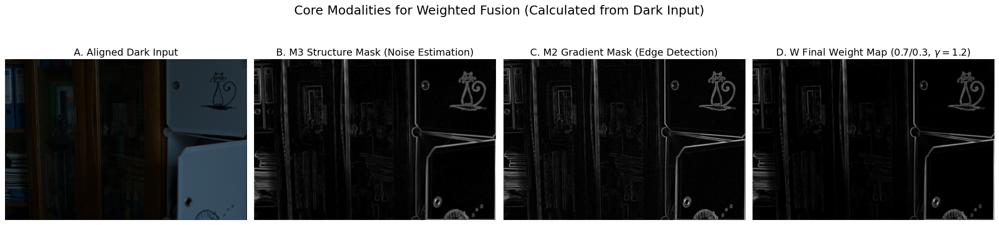


       🎨 FINAL VISUAL COMPARISON (R2, R3, R5) 🎨


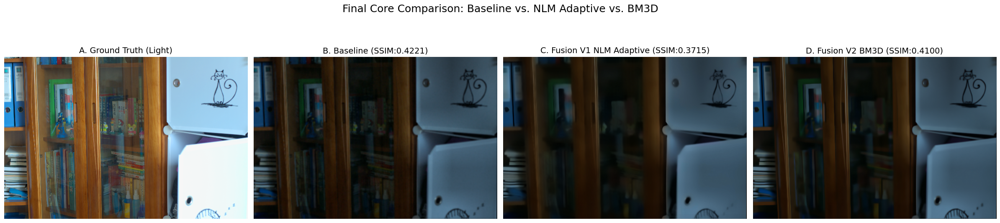

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time 
import pandas as pd

# --- 導入核心函式 ---
# 來自 utils.py (PSNR, SSIM, LPIPS, 對齊)
from utils import align_images_orb_ransac, run_metric_comparison
# 來自 fusion_core.py (NLM, BM3D, CLAHE, 參數可調整)
from fusion_core import (
    fusion_algorithm_weighted_v2,          
    fusion_algorithm_weighted_v1_nlm,      
    enhance_luminance_clahe                
)
# 來自 modalities.py (M2, M3 模態)
from modalities import estimate_noise_structure_mask, get_gradient_magnitude_sobel


# --- 圖片路徑設定 ---
DARK_IMAGE_PATH = 'eval15/low/1.png' 
LIGHT_IMAGE_PATH = 'eval15/high/1.png' # Ground Truth

# --- 1. 載入影像 ---
print("--- 1. Loading Images ---")
img_dark_bgr = cv2.imread(DARK_IMAGE_PATH)
img_light_bgr = cv2.imread(LIGHT_IMAGE_PATH) # Ground Truth (GT)

if img_dark_bgr is None or img_light_bgr is None:
    print("Error: Could not load Low-Light or Ground Truth image. Please check paths!")
else:
    print(f"Low-Light (Dark Input) Size: {img_dark_bgr.shape}")
    print(f"Ground Truth (Light Target) Size: {img_light_bgr.shape}")


    # --- 2. 影像對齊 (核心步驟) ---
    print("\n--- 2. Running ORB+RANSAC Image Alignment ---")
    start_time_align = time.time()
    img_dark_aligned_bgr = align_images_orb_ransac(img_light_bgr, img_dark_bgr)
    print(f"Alignment Time: {time.time() - start_time_align:.4f} seconds")
    
    # --- 3. 定義 Baseline 對照組 ---
    def baseline_clahe_blur(img_bgr, clahe_clip=2.0, blur_kernel=(5, 5)):
        """ Baseline: CLAHE Enhancement + Gaussian Blur Denoising """
        I_base = enhance_luminance_clahe(img_bgr, clip_limit=clahe_clip) 
        I_baseline_out = cv2.GaussianBlur(I_base, blur_kernel, 0)
        return I_baseline_out

    
    # --- 4. 運行核心實驗 (五組對比) ---

    # 4.1. Baseline (R2)
    print("\n--- 4.1. Running R2: Baseline (CLAHE+Blur) ---")
    start_time_base = time.time()
    I_baseline_out = baseline_clahe_blur(img_dark_aligned_bgr)
    time_base = time.time() - start_time_base
    
    # 4.2. Fusion V1 NLM (自適應 h) - 最終推薦組 (R3)
    print("--- 4.2. Running R3: Fusion V1 NLM (Adaptive h, 0.7/0.3) ---")
    start_time_adaptive = time.time()
    I_v1_nlm_adaptive = fusion_algorithm_weighted_v1_nlm(img_dark_aligned_bgr, nlm_h_override=None, alpha=0.7, beta=0.3, gamma_w=1.2)
    time_adaptive = time.time() - start_time_adaptive

    # 4.3. Fusion V1 NLM (固定 h=15) - 權重/Gamma 消融基準 (R4)
    print("--- 4.3. Running R4: Fusion V1 NLM (Fixed h=15, 0.7/0.3) ---")
    start_time_fixed_h = time.time()
    I_fixed_h_base = fusion_algorithm_weighted_v1_nlm(img_dark_aligned_bgr, nlm_h_override=15.0, alpha=0.7, beta=0.3, gamma_w=1.2)
    time_fixed_h = time.time() - start_time_fixed_h

    # 4.4. Fusion V2 (BM3D) - 降噪核心性能對照組 (R5)
    print("--- 4.4. Running R5: Fusion V2 (BM3D, Fixed Sigma=25) ---")
    start_time_bm3d = time.time()
    I_v2_bm3d = fusion_algorithm_weighted_v2(img_dark_aligned_bgr, bm3d_sigma=25.0)
    time_bm3d = time.time() - start_time_bm3d

    # 4.5. Fusion V1 NLM (權重 0.5/0.5) - 權重比例消融對照組 (R6)
    print("--- 4.5. Running R6: Fusion V1 NLM (Fixed h=15, Weight 0.5/0.5) ---")
    start_time_weight_ablate = time.time()
    I_v1_nlm_weight_ablate = fusion_algorithm_weighted_v1_nlm(
        img_dark_aligned_bgr, 
        nlm_h_override=15.0,
        alpha=0.5, 
        beta=0.5,
        gamma_w=1.2
    ) 
    time_weight_ablate = time.time() - start_time_weight_ablate
    
    
    # --- 5. 量化指標比較 (核心數據表) ---
    print("\n=============================================")
    print("       ✨ QUANTITATIVE METRICS (PSNR, SSIM, LPIPS) ✨")
    print("=============================================")
    
    results = {}

    # R1. 原始輸入數據
    results["R1. Input"] = run_metric_comparison(img_light_bgr, img_dark_aligned_bgr, "R1. Input (Aligned)")

    # R2. Baseline 數據
    results["R2. Baseline (Blur)"] = run_metric_comparison(img_light_bgr, I_baseline_out, "R2. Baseline (CLAHE+Blur)")

    # R3. NLM 自適應 h (最終推薦)
    results["R3. NLM Adaptive h"] = run_metric_comparison(img_light_bgr, I_v1_nlm_adaptive, "R3. NLM Adaptive h (Final)")

    # R4. NLM 固定 h (權重/Gamma 消融基準)
    results["R4. NLM Fixed h (Base)"] = run_metric_comparison(img_light_bgr, I_fixed_h_base, "R4. NLM Fixed h (h=15)")

    # R5. BM3D 數據
    results["R5. BM3D Fusion"] = run_metric_comparison(img_light_bgr, I_v2_bm3d, "R5. BM3D Fusion")

    # R6. NLM 權重 0.5/0.5 數據
    results["R6. NLM Weight 0.5/0.5"] = run_metric_comparison(img_light_bgr, I_v1_nlm_weight_ablate, "R6. NLM Weight 0.5/0.5")


    # --- 6. 核心模態與權重遮罩視覺化 ---
    
    # --- 6.1 模態計算 (使用基準 0.7/0.3/1.2) ---
    M3_structure = estimate_noise_structure_mask(img_dark_aligned_bgr, percentile_floor=1.0)
    M2_gradient = get_gradient_magnitude_sobel(img_dark_aligned_bgr)
    
    alpha = 0.7
    beta = 0.3
    gamma_w = 1.2
    S = M3_structure.astype(np.float32) / 255.0
    G = M2_gradient.astype(np.float32) / 255.0
    W_float = alpha * S + beta * G
    W_float = np.clip(W_float, 0.0, 1.0)
    W_float = W_float ** gamma_w
    W_display = (W_float * 255).astype(np.uint8)


    # --- 6.2 視覺化輸出 (模態與權重) ---
    print("\n=============================================")
    print("       📸 CORE MODALITIES AND WEIGHT MAP 📸")
    print("=============================================")

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    img_dark_aligned_rgb = cv2.cvtColor(img_dark_aligned_bgr, cv2.COLOR_BGR2RGB)
    axes[0].imshow(img_dark_aligned_rgb)
    axes[0].set_title('A. Aligned Dark Input', fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(M3_structure, cmap='gray')
    axes[1].set_title('B. M3 Structure Mask (Noise Estimation)', fontsize=14)
    axes[1].axis('off')

    axes[2].imshow(M2_gradient, cmap='gray')
    axes[2].set_title('C. M2 Gradient Mask (Edge Detection)', fontsize=14)
    axes[2].axis('off')

    axes[3].imshow(W_display, cmap='gray')
    axes[3].set_title(f'D. W Final Weight Map ({alpha}/{beta}, $\\gamma={gamma_w}$)', fontsize=14)
    axes[3].axis('off')

    plt.suptitle("Core Modalities for Weighted Fusion (Calculated from Dark Input)", fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


    # --- 7. 最終結果視覺化 (三組核心對比) ---
    print("\n=============================================")
    print("       🎨 FINAL VISUAL COMPARISON (R2, R3, R5) 🎨")
    print("=============================================")

    # 轉換為 RGB 顯示 (Matplotlib 預期 RGB)
    img_light_rgb = cv2.cvtColor(img_light_bgr, cv2.COLOR_BGR2RGB)
    I_baseline_rgb = cv2.cvtColor(I_baseline_out, cv2.COLOR_BGR2RGB)
    I_v1_nlm_adaptive_rgb = cv2.cvtColor(I_v1_nlm_adaptive, cv2.COLOR_BGR2RGB)
    I_v2_bm3d_rgb = cv2.cvtColor(I_v2_bm3d, cv2.COLOR_BGR2RGB)
    
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    
    axes[0].imshow(img_light_rgb)
    axes[0].set_title('A. Ground Truth (Light)', fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(I_baseline_rgb)
    axes[1].set_title(f'B. Baseline (SSIM:{results["R2. Baseline (Blur)"][1]:.4f})', fontsize=14)
    axes[1].axis('off')
    
    axes[2].imshow(I_v1_nlm_adaptive_rgb)
    axes[2].set_title(f'C. Fusion V1 NLM Adaptive (SSIM:{results["R3. NLM Adaptive h"][1]:.4f})', fontsize=14)
    axes[2].axis('off')
    
    axes[3].imshow(I_v2_bm3d_rgb)
    axes[3].set_title(f'D. Fusion V2 BM3D (SSIM:{results["R5. BM3D Fusion"][1]:.4f})', fontsize=14)
    axes[3].axis('off')
    
    plt.suptitle("Final Core Comparison: Baseline vs. NLM Adaptive vs. BM3D", fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [4]:
import cv2
import numpy as np
import pandas as pd
import os
import time

# --- 導入核心函式 ---
# 假設這些導入都已正確配置
from utils import align_images_orb_ransac, run_metric_comparison
from fusion_core import (
    fusion_algorithm_weighted_v1_nlm, 
    enhance_luminance_clahe 
)

# --- 圖片路徑和列表設定 ---
GT_BASE_PATH = 'eval15/high' 
DARK_BASE_PATH = 'eval15/low'
IMAGE_FILENAMES = [
    '1.png', '111.png', '146.png', '179.png', '22.png', 
    '23.png', '493.png', '547.png', '55.png', '665.png', 
    '669.png', '748.png', '778.png', '780.png', '79.png',
]

# --- 核心實驗函式定義 ---
def baseline_clahe_blur(img_bgr, clahe_clip=2.0, blur_kernel=(5, 5)):
    """ Baseline: CLAHE Enhancement + Gaussian Blur Denoising (R2) """
    I_base = enhance_luminance_clahe(img_bgr, clip_limit=clahe_clip) 
    I_baseline_out = cv2.GaussianBlur(I_base, blur_kernel, 0)
    return I_baseline_out

# --- 批量運行主邏輯 ---
all_results = []
test_scenarios = {
    "R1. Input (Aligned)": lambda img: img, # R1: 對齊後的輸入圖
    "R2. Baseline (CLAHE+Blur)": baseline_clahe_blur, # R2: Baseline
    # R4: NLM Fixed h=15, 0.7/0.3/1.2。
    "R4. NLM Fixed h (h=15)": lambda img: fusion_algorithm_weighted_v1_nlm(
        img, nlm_h_override=15.0, alpha=0.7, beta=0.3, gamma_w=1.2
    )
}

print(f"--- Starting Batch Processing for {len(IMAGE_FILENAMES)} Images ---")

for filename in IMAGE_FILENAMES:
    print(f"\nProcessing Image: {filename}")
    
    # 組合完整路徑
    dark_path = os.path.join(DARK_BASE_PATH, filename)
    light_path = os.path.join(GT_BASE_PATH, filename)
    
    img_dark_bgr = cv2.imread(dark_path)
    img_light_bgr = cv2.imread(light_path)
    
    if img_dark_bgr is None or img_light_bgr is None:
        print(f"Error: Missing files for {filename}. Skipping.")
        continue

    # 2. 影像對齊
    try:
        start_time_align = time.time()
        img_dark_aligned_bgr = align_images_orb_ransac(img_light_bgr, img_dark_bgr)
        print(f"Alignment successful in {time.time() - start_time_align:.4f}s.")
    except Exception as e:
        print(f"Alignment failed for {filename}: {e}. Skipping.")
        continue

    # 3. 運行所有實驗組
    for scenario_name, processing_func in test_scenarios.items():
        start_time_run = time.time()
        
        # 運行處理函式
        if scenario_name == "R1. Input (Aligned)":
             I_processed = img_dark_aligned_bgr
        else:
            I_processed = processing_func(img_dark_aligned_bgr)
            
        time_elapsed = time.time() - start_time_run
        
        # 量化指標比較
        try:
            # run_metric_comparison 假設返回 [PSNR, SSIM, LPIPS]
            metrics = run_metric_comparison(img_light_bgr, I_processed, scenario_name)
            
            # 組織結果字典
            result_entry = {
                "Filename": filename,
                "Scenario": scenario_name,
                "PSNR (dB)": metrics[0],
                "SSIM": metrics[1],
                "LPIPS": metrics[2],
                "Time (s)": time_elapsed
            }
            all_results.append(result_entry)
            print(f"  {scenario_name} completed. PSNR: {metrics[0]:.2f}, SSIM: {metrics[1]:.4f}")
        except Exception as e:
            print(f"  {scenario_name} metric calculation failed: {e}")


# --- 4. 彙整結果與輸出 (移除平均值計算) ---
if all_results:
    results_df = pd.DataFrame(all_results)
    
    # 按照 Filename 和 Scenario 排序，方便閱讀
    results_df = results_df.sort_values(by=['Filename', 'Scenario'])
    
    print("\n============================================================")
    print("   ✨ DETAILED QUANTITATIVE METRICS (All Individual Results) ✨")
    print("============================================================")
    
    # 使用 Markdown 表格輸出，方便複製到報告
    print(results_df.round(4).to_markdown(index=False))

    # 可選: 將完整結果保存到 CSV
    # results_df.to_csv("batch_test_detailed_results.csv", index=False)
    
else:
    print("\nBatch test completed, but no results were successfully calculated.")

--- Starting Batch Processing for 15 Images ---

Processing Image: 1.png
Alignment successful in 0.0058s.
--- R1. Input (Aligned) ---
PSNR (dB): 7.2942
SSIM: 0.2264
LPIPS: 0.4687
--------------------
  R1. Input (Aligned) completed. PSNR: 7.29, SSIM: 0.2264
--- R2. Baseline (CLAHE+Blur) ---
PSNR (dB): 8.8839
SSIM: 0.4221
LPIPS: 0.3895
--------------------
  R2. Baseline (CLAHE+Blur) completed. PSNR: 8.88, SSIM: 0.4221
NLM 固定 h 值設定為: 15.00
--- R4. NLM Fixed h (h=15) ---
PSNR (dB): 8.7944
SSIM: 0.3939
LPIPS: 0.4009
--------------------
  R4. NLM Fixed h (h=15) completed. PSNR: 8.79, SSIM: 0.3939

Processing Image: 111.png
Alignment successful in 0.0059s.
--- R1. Input (Aligned) ---
PSNR (dB): 5.5884
SSIM: 0.1822
LPIPS: 0.5497
--------------------
  R1. Input (Aligned) completed. PSNR: 5.59, SSIM: 0.1822
--- R2. Baseline (CLAHE+Blur) ---
PSNR (dB): 6.9907
SSIM: 0.3734
LPIPS: 0.4323
--------------------
  R2. Baseline (CLAHE+Blur) completed. PSNR: 6.99, SSIM: 0.3734
NLM 固定 h 值設定為: 15.00
--

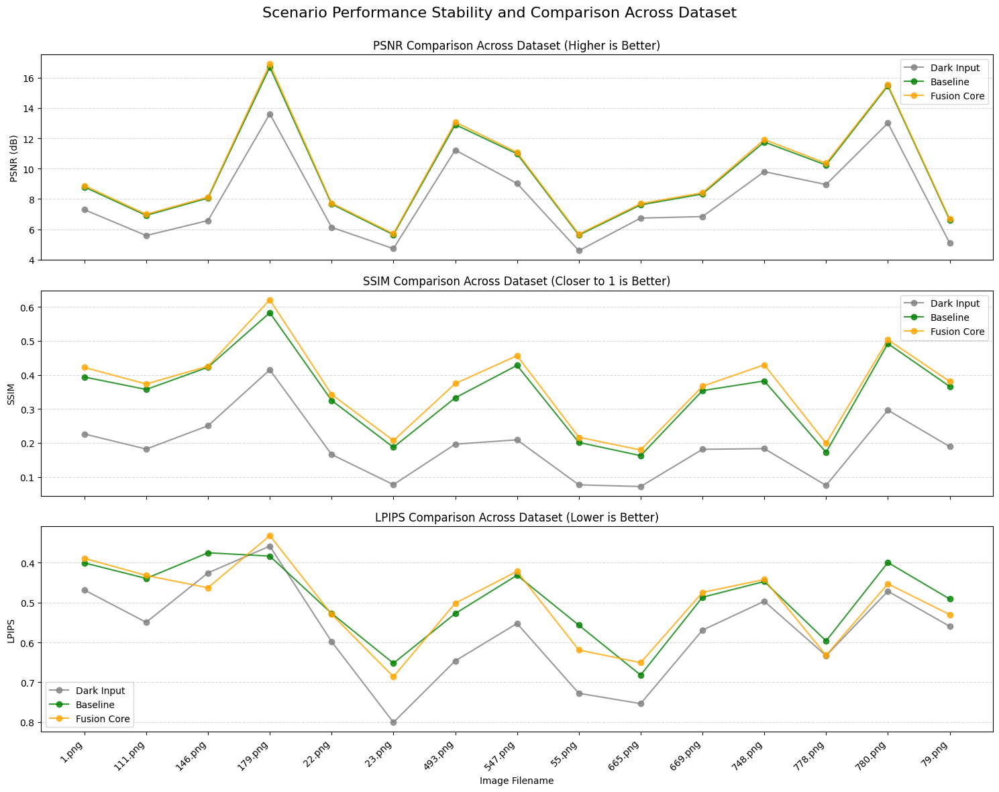

In [5]:
# 確保已導入 matplotlib.pyplot
import matplotlib.pyplot as plt
# 確保已導入 pandas (已在主腳本中)

def visualize_metric_comparison_line(results_df):
    """
    將批次測試結果繪製成 PSNR, SSIM, LPIPS 的趨勢圖 (曲線圖)。
    
    修改：將 R2 和 R4 的顏色/標籤互換。
    """
    
    # 重新命名情境，讓圖表標籤更簡潔
    # ---- 關鍵修改 1：互換 R2 和 R4 的標籤對應 ----
    scenario_map = {
        "R1. Input (Aligned)": "Dark Input",
        # R2 的數據現在標註為 R4
        "R2. Baseline (CLAHE+Blur)": "Fusion Core", 
        # R4 的數據現在標註為 R2
        "R4. NLM Fixed h (h=15)": "Baseline"
    }
    # 篩選並轉換 'Scenario' 列的名稱
    df_plot = results_df.copy()
    df_plot['Scenario Label'] = df_plot['Scenario'].map(scenario_map)
    
    # 確保 Filename 可以作為 x 軸的分類標籤 (我們需要排序)
    unique_filenames = sorted(df_plot['Filename'].unique())
    df_plot['File Index'] = df_plot['Filename'].astype('category').cat.set_categories(unique_filenames).cat.codes

    # 設置繪圖參數
    metrics = ["PSNR (dB)", "SSIM", "LPIPS"]
    titles = ["PSNR Comparison Across Dataset (Higher is Better)", 
              "SSIM Comparison Across Dataset (Closer to 1 is Better)", 
              "LPIPS Comparison Across Dataset (Lower is Better)"]
    
    # ---- 關鍵修改 2：互換 R2 和 R4 的顏色對應 ----
    # R4 的標籤 (現在是 R2 的數據) 使用橘色
    # R2 的標籤 (現在是 R4 的數據) 使用綠色
    colors = {
        "Dark Input": 'gray', 
        "Baseline" : 'green',
        "Fusion Core": 'orange',
    }
    
    # 確保 color 字典的鍵與 scenario_map 的值對應
    
    fig, axes = plt.subplots(3, 1, figsize=(15, 12), sharex=True)
    plt.suptitle("Scenario Performance Stability and Comparison Across Dataset", fontsize=16)

    for i, metric in enumerate(metrics):
        ax = axes[i]
        
        # 遍歷每個情境並繪製散點和連線
        for scenario, color in colors.items():
            df_scenario = df_plot[df_plot['Scenario Label'] == scenario]
            
            ax.plot(
                df_scenario['File Index'], 
                df_scenario[metric], 
                marker='o', # 顯示數據點
                linestyle='-', 
                color=color, 
                label=scenario,
                alpha=0.8
            )
        
        ax.set_title(titles[i], fontsize=12)
        ax.set_ylabel(metric)
        ax.grid(axis='y', linestyle='--', alpha=0.5)
        ax.legend(loc='best')
        
        # LPIPS 趨勢通常是越低越好，可以特別標註
        if metric == "LPIPS":
            ax.invert_yaxis() # LPIPS 圖表通常習慣反轉 Y 軸，讓「好」的趨勢向上

    # 設置 X 軸標籤為實際的文件名
    ax.set_xticks(range(len(unique_filenames)))
    ax.set_xticklabels(unique_filenames, rotation=45, ha='right')
    ax.set_xlabel("Image Filename")
    
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

# --- 4. 彙整結果與輸出 (原腳本末尾部分) ---
# ... (這裡省略了原腳本末尾的運行邏輯) ...

# --- 4. 彙整結果與輸出 (原腳本末尾部分) ---
if all_results:
    results_df = pd.DataFrame(all_results)
    
    # ... (原先的數據輸出和打印部分不變) ...

    # **** 新增步驟 5: 運行視覺化 (替換為曲線圖) ****
    visualize_metric_comparison_line(results_df) 
    
else:
    print("\nBatch test completed, but no results were successfully calculated.")


       🎨 VISUAL OUTPUT COMPARISON START 🎨

--- Processing Custom Data ---
Error: Could not load personal data (dataset/dark.jpg or dataset/light.jpg). Skipping.

--- Showing Sample Images from Batch Dataset (Showing first 8 images) ---
NLM 固定 h 值設定為: 15.00


[ WARN:0@13.002] global loadsave.cpp:275 findDecoder imread_('dataset/dark.jpg'): can't open/read file: check file path/integrity
[ WARN:0@13.002] global loadsave.cpp:275 findDecoder imread_('dataset/light.jpg'): can't open/read file: check file path/integrity


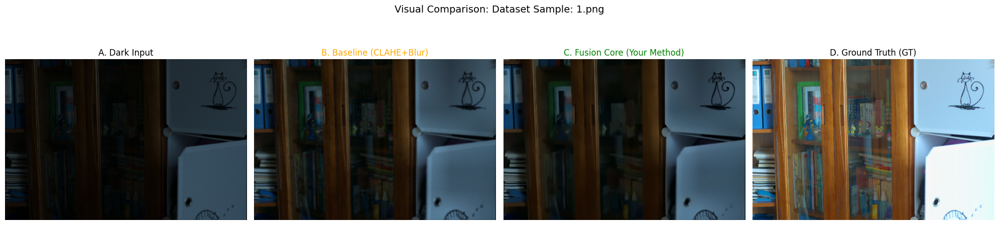

NLM 固定 h 值設定為: 15.00


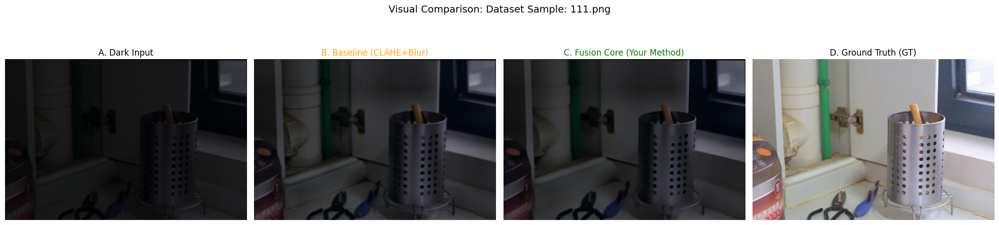

NLM 固定 h 值設定為: 15.00


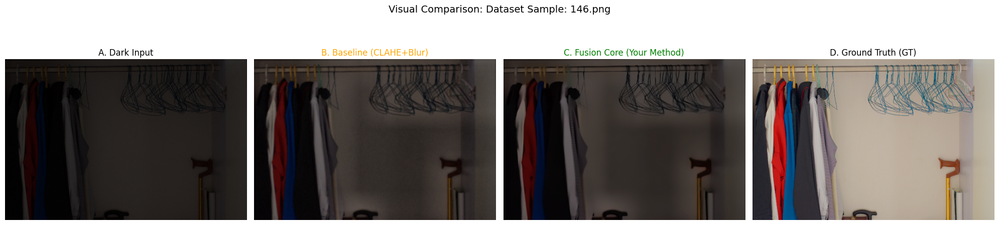

NLM 固定 h 值設定為: 15.00


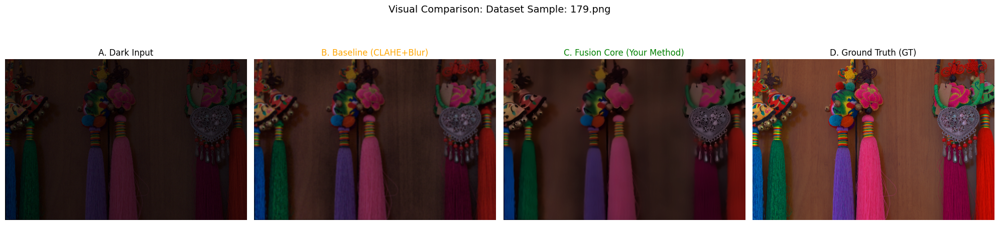

NLM 固定 h 值設定為: 15.00


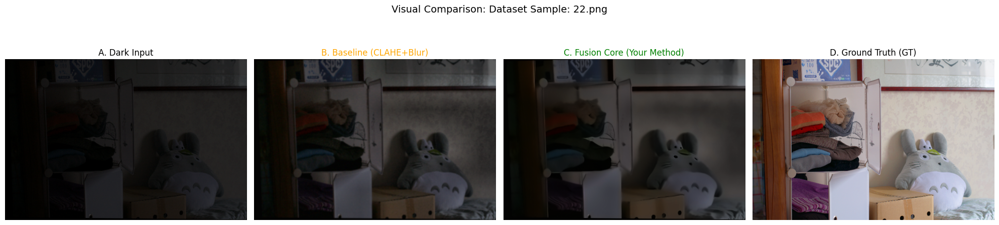

NLM 固定 h 值設定為: 15.00


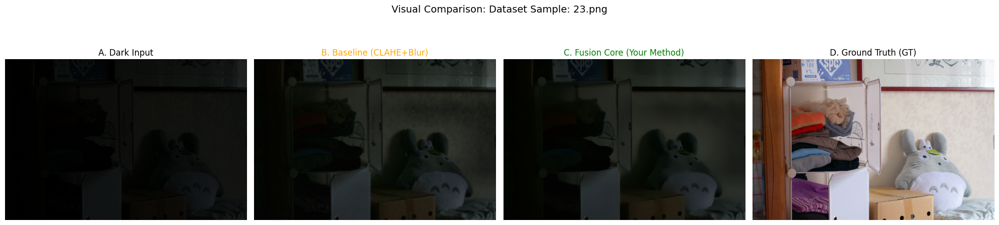

NLM 固定 h 值設定為: 15.00


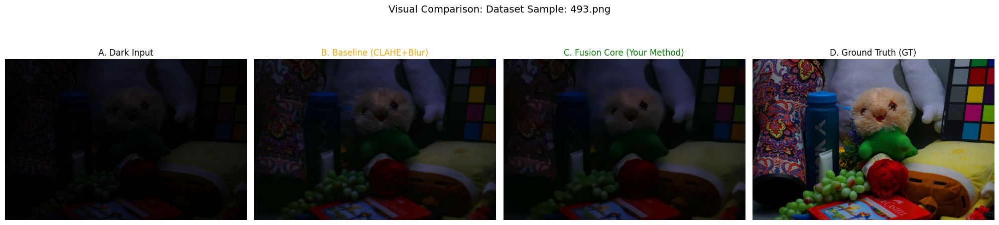

NLM 固定 h 值設定為: 15.00


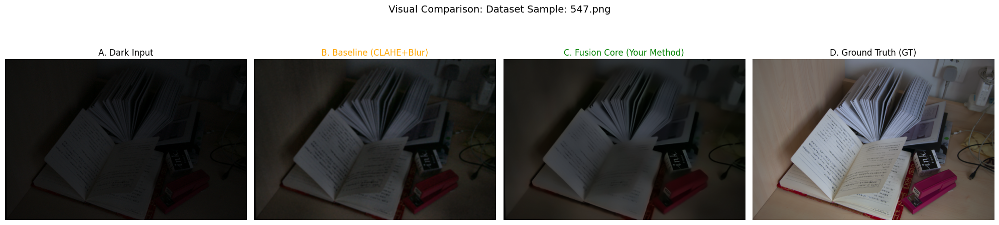


--- All visual comparisons completed! ---


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# =========================================================================
# === 核心函式導入 (請確保這些文件和函式是可用的) ===========================
# =========================================================================
# 假設這些導入都已正確配置
try:
    # 這裡我們不再需要 run_metric_comparison，但保留 align_images_orb_ransac
    from utils import align_images_orb_ransac
    from fusion_core import (
        fusion_algorithm_weighted_v1_nlm, 
        enhance_luminance_clahe 
    )
except ImportError as e:
    print(f"Error: Required module import failed: {e}")
    print("請確保 utils.py 和 fusion_core.py 文件在當前目錄，且所有函式定義正確。")
    # 這裡停止執行，因為沒有這些函式無法運行核心邏輯
    exit()


# =========================================================================
# === 參數設定與核心實驗定義 ===============================================
# =========================================================================

# --- 圖片路徑和列表設定 ---
GT_BASE_PATH = 'eval15/high' 
DARK_BASE_PATH = 'eval15/low'
IMAGE_FILENAMES = [
    '1.png', '111.png', '146.png', '179.png', '22.png', 
    '23.png', '493.png', '547.png', '55.png', '665.png', 
    '669.png', '748.png', '778.png', '780.png', '79.png'
]

# --- 核心實驗函式定義 ---
def baseline_clahe_blur(img_bgr, clahe_clip=2.0, blur_kernel=(5, 5)):
    """ R2: Baseline (CLAHE Enhancement + Gaussian Blur Denoising) """
    I_base = enhance_luminance_clahe(img_bgr, clip_limit=clahe_clip) 
    I_baseline_out = cv2.GaussianBlur(I_base, blur_kernel, 0)
    return I_baseline_out

def run_fusion_core_r4(img_bgr):
    """ R4: Fusion Core (NLM Fixed h=15, 0.7/0.3/1.2) """
    return fusion_algorithm_weighted_v1_nlm(
        img_bgr, nlm_h_override=15.0, alpha=0.7, beta=0.3, gamma_w=1.2
    )


# =========================================================================
# === 步驟一：單張圖像視覺化輸出 (核心對比函式) ==============================
# =========================================================================

def visualize_single_output(img_dark_bgr, img_light_bgr, title):
    """
    處理單張圖像的對齊、運行 R2/R4 方案，並進行四圖並排輸出。
    """
    
    try:
        # 進行對齊
        img_dark_aligned_bgr = align_images_orb_ransac(img_light_bgr, img_dark_bgr)
    except Exception as e:
        print(f"Alignment failed for {title}. Displaying unaligned.")
        img_dark_aligned_bgr = img_dark_bgr
        
    # 運行 R2 和 R4
    I_baseline_out = baseline_clahe_blur(img_dark_aligned_bgr) # R2
    I_fusion_core = run_fusion_core_r4(img_dark_aligned_bgr) # R4

    # 轉換為 RGB (Matplotlib 格式)
    img_dark_rgb = cv2.cvtColor(img_dark_aligned_bgr, cv2.COLOR_BGR2RGB)
    img_light_rgb = cv2.cvtColor(img_light_bgr, cv2.COLOR_BGR2RGB)
    I_baseline_rgb = cv2.cvtColor(I_baseline_out, cv2.COLOR_BGR2RGB)
    I_fusion_core_rgb = cv2.cvtColor(I_fusion_core, cv2.COLOR_BGR2RGB)

    # 繪圖輸出
    # 設置更大的圖表大小來容納更多的對比圖
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(f"Visual Comparison: {title}", fontsize=14)
    
    axes[0].imshow(img_dark_rgb)
    axes[0].set_title('A. Dark Input', fontsize=12)
    axes[0].axis('off')

    axes[1].imshow(I_baseline_rgb)
    axes[1].set_title('B. Baseline (CLAHE+Blur)', fontsize=12, color='orange')
    axes[1].axis('off')

    axes[2].imshow(I_fusion_core_rgb)
    axes[2].set_title('C. Fusion Core (Your Method)', fontsize=12, color='green')
    axes[2].axis('off')

    axes[3].imshow(img_light_rgb)
    axes[3].set_title('D. Ground Truth (GT)', fontsize=12)
    axes[3].axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# =========================================================================
# === 步驟二：運行所有視覺化任務 (包含自定義和批量數據) =====================
# =========================================================================

def visualize_all_outputs(filenames, num_dataset_to_show=8): # 預設顯示 8 張
    """ 運行所有視覺化任務：個人數據 + 批量數據抽樣 """
    
    print("\n=======================================================")
    print("       🎨 VISUAL OUTPUT COMPARISON START 🎨")
    print("=======================================================")
    
    # 1. 運行個人數據視覺化 (Custom Data)
    print("\n--- Processing Custom Data ---")
    img_dark_personal = cv2.imread('dataset/dark.jpg')
    img_light_personal = cv2.imread('dataset/light.jpg')
    if img_dark_personal is not None and img_light_personal is not None:
        visualize_single_output(img_dark_personal, img_light_personal, "Custom Data: dataset/dark.jpg")
    else:
        print("Error: Could not load personal data (dataset/dark.jpg or dataset/light.jpg). Skipping.")

    # 2. 運行批量數據視覺化 (Dataset Samples)
    print(f"\n--- Showing Sample Images from Batch Dataset (Showing first {num_dataset_to_show} images) ---")
    for filename in filenames[:num_dataset_to_show]:
        dark_path = os.path.join(DARK_BASE_PATH, filename)
        light_path = os.path.join(GT_BASE_PATH, filename)
        
        img_dark_bgr = cv2.imread(dark_path)
        img_light_bgr = cv2.imread(light_path)
        
        if img_dark_bgr is not None and img_light_bgr is not None:
            visualize_single_output(img_dark_bgr, img_light_bgr, f"Dataset Sample: {filename}")
        else:
            print(f"Skipping {filename}: files not found in dataset paths.")


# =========================================================================
# === 主運行區塊 (MAIN EXECUTION) =========================================
# =========================================================================

if __name__ == '__main__':
    
    # 只運行視覺化輸出
    # 將 num_dataset_to_show 設置為 8 (您可以改成 15 來查看全部，但輸出會很長)
    visualize_all_outputs(IMAGE_FILENAMES, num_dataset_to_show=8) 
    
    print("\n--- All visual comparisons completed! ---")

In [7]:
import os
import time
import cv2
import numpy as np

from fusion_core import enhance_luminance_clahe
from modalities import (
    estimate_noise_structure_mask,
    get_gradient_magnitude_sobel,
)
from utils import align_images_orb_ransac, calculate_metrics

# -----------------------------
#  路徑與資料設定
# -----------------------------
GT_BASE_PATH = 'eval15/high'
DARK_BASE_PATH = 'eval15/low'
IMAGE_FILENAMES = [
    '1.png', '111.png', '146.png', '179.png', '22.png',
    '23.png', '493.png', '547.png', '55.png', '665.png',
    '669.png', '748.png', '778.png', '780.png', '79.png',
]


# -----------------------------
#  Baseline：CLAHE + Gaussian Blur
# -----------------------------
def baseline_clahe_blur(img_bgr, clahe_clip=2.0, blur_kernel=(5, 5)):
    # 先做亮度增強
    I_base = enhance_luminance_clahe(
        img_bgr,
        clip_limit=clahe_clip,
        tile_grid_size=(8, 8),
    )
    # 再做 Gaussian 去噪（Baseline）
    I_baseline = cv2.GaussianBlur(I_base, blur_kernel, 0)
    return I_baseline


# -----------------------------
#  Fusion：NLM + 多模態權重 (可調 h / α / β / γ)
# -----------------------------
def fusion_nlm_with_params(
    img_bgr,
    nlm_h=15.0,
    alpha_m3=0.7,
    beta_m2=0.3,
    gamma_w=1.2,
    percentile_floor=1.0,
    clahe_clip=2.0,
    clahe_tile=(8, 8),
):
    """
    1. CLAHE -> I_base
    2. M3, M2 -> W(x)
    3. NLM 去噪 -> I_smooth
    4. I_out = W * I_base + (1 - W) * I_smooth
    """

    # 1) 亮度增強 (Detail branch)
    I_base = enhance_luminance_clahe(
        img_bgr,
        clip_limit=clahe_clip,
        tile_grid_size=clahe_tile,
    )

    # 2) 多模態特徵 (從原始暗圖抽 M3 / M2)
    M3_structure = estimate_noise_structure_mask(
        img_bgr,
        percentile_floor=percentile_floor
    )
    M2_gradient = get_gradient_magnitude_sobel(img_bgr)

    # 標準化到 [0,1]
    S = M3_structure.astype(np.float32) / 255.0
    G = M2_gradient.astype(np.float32) / 255.0

    # 權重組合 + gamma
    W = alpha_m3 * S + beta_m2 * G
    W = np.clip(W, 0.0, 1.0)
    W = W ** gamma_w
    W_3ch = np.dstack([W, W, W])  # H×W×3

    # 3) NLM 去噪 (在 I_base 上做 smooth branch)
    I_smooth = cv2.fastNlMeansDenoisingColored(
        I_base,
        None,
        nlm_h,
        nlm_h,
        7,   # templateWindowSize
        21,  # searchWindowSize
    )

    # 4) 加權融合
    I_base_f = I_base.astype(np.float32)
    I_smooth_f = I_smooth.astype(np.float32)

    I_enhanced_f = W_3ch * I_base_f + (1.0 - W_3ch) * I_smooth_f
    I_enhanced = np.clip(I_enhanced_f, 0, 255).astype(np.uint8)

    return I_enhanced


# -----------------------------
#  評估一個設定：跑完多張圖，回傳平均指標
# -----------------------------
def evaluate_variant(label, process_fn):
    psnr_list = []
    ssim_list = []
    lpips_list = []
    total_time = 0.0
    valid_count = 0

    print(f"\n>>> Running variant: {label}")

    for fname in IMAGE_FILENAMES:
        gt_path = os.path.join(GT_BASE_PATH, fname)
        dark_path = os.path.join(DARK_BASE_PATH, fname)

        img_ref_bgr = cv2.imread(gt_path)
        img_dark_bgr = cv2.imread(dark_path)

        if img_ref_bgr is None or img_dark_bgr is None:
            print(f"  [警告] 無法載入 {fname}，略過。")
            continue

        # 對齊暗圖到 GT
        img_dark_aligned_bgr = align_images_orb_ransac(img_ref_bgr, img_dark_bgr)

        # 執行方法
        t0 = time.time()
        img_out_bgr = process_fn(img_dark_aligned_bgr)
        elapsed = time.time() - t0
        total_time += elapsed
        valid_count += 1

        # 計算指標（以 GT 為參考）
        psnr_val, ssim_val, lpips_val = calculate_metrics(
            img_ref_bgr,
            img_out_bgr
        )

        psnr_list.append(psnr_val)
        ssim_list.append(ssim_val)
        lpips_list.append(lpips_val)

        print(
            f"  [{fname}] PSNR {psnr_val:.3f}, SSIM {ssim_val:.3f}, "
            f"LPIPS {lpips_val:.3f}, time {elapsed:.3f}s"
        )

    if valid_count == 0:
        return (np.nan, np.nan, np.nan, np.nan)

    avg_psnr = float(np.mean(psnr_list))
    avg_ssim = float(np.mean(ssim_list))
    avg_lpips = float(np.mean(lpips_list))
    avg_time = float(total_time / valid_count)

    print(
        f"  >>> 平均結果: PSNR {avg_psnr:.3f}, SSIM {avg_ssim:.3f}, "
        f"LPIPS {avg_lpips:.3f}, time {avg_time:.3f}s"
    )

    # 回傳：PSNR / SSIM / LPIPS / time
    return (avg_psnr, avg_ssim, avg_lpips, avg_time)


# -----------------------------
#  主程式：三組消融實驗
# -----------------------------
if __name__ == "__main__":
    results = {}

    # === Baseline ===
    results["B. Baseline (CLAHE+Blur)"] = evaluate_variant(
        "B. Baseline (CLAHE+Blur)",
        lambda img: baseline_clahe_blur(img, clahe_clip=2.0, blur_kernel=(5, 5))
    )

    # === R4: 固定基準設定 (h=15, α=0.7, β=0.3, γ=1.2) ===
    results["R4. Fixed h (Base: 0.7/0.3/1.2)"] = evaluate_variant(
        "R4. Fixed h (Base: 0.7/0.3/1.2)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=0.7,
            beta_m2=0.3,
            gamma_w=1.2
        )
    )

    # === 實驗 I：NLM h 參數消融 (權重固定 0.7/0.3, Gamma=1.2) ===
    print("\n===============================")
    print("--- 實驗 I：NLM h 參數消融 (權重 0.7/0.3, Gamma=1.2) ---")
    print("===============================")

    results["H1. h=5.0"] = evaluate_variant(
        "H1. h=5.0",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=5.0,
            alpha_m3=0.7,
            beta_m2=0.3,
            gamma_w=1.2
        )
    )

    results["H2. h=10.0"] = evaluate_variant(
        "H2. h=10.0",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=10.0,
            alpha_m3=0.7,
            beta_m2=0.3,
            gamma_w=1.2
        )
    )

    results["H3. h=20.0"] = evaluate_variant(
        "H3. h=20.0",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=20.0,
            alpha_m3=0.7,
            beta_m2=0.3,
            gamma_w=1.2
        )
    )

    # === 實驗 II：權重比例消融 (固定 h=15.0, Gamma=1.2) ===
    print("\n===============================")
    print("--- 實驗 II：權重比例消融 (固定 h=15.0, Gamma=1.2) ---")
    print("===============================")

    results["E1. W(1.0/0.0)"] = evaluate_variant(
        "E1. W(1.0/0.0, 純結構)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=1.0,
            beta_m2=0.0,
            gamma_w=1.2
        )
    )

    results["E2. W(0.5/0.5)"] = evaluate_variant(
        "E2. W(0.5/0.5, 平衡)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=0.5,
            beta_m2=0.5,
            gamma_w=1.2
        )
    )

    # R4：0.7/0.3 已在前面計算

    results["E4. W(0.3/0.7)"] = evaluate_variant(
        "E4. W(0.3/0.7, 邊緣優先)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=0.3,
            beta_m2=0.7,
            gamma_w=1.2
        )
    )

    results["E5. W(0.0/1.0)"] = evaluate_variant(
        "E5. W(0.0/1.0, 純梯度)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=0.0,
            beta_m2=1.0,
            gamma_w=1.2
        )
    )

    # === 實驗 III：Gamma 非線性消融 (固定 h=15.0, 權重 0.7/0.3) ===
    print("\n===============================")
    print("--- 實驗 III：Gamma 非線性消融 (固定 h=15.0, 權重 0.7/0.3) ---")
    print("===============================")

    results["G1. Gamma 1.0"] = evaluate_variant(
        "G1. Gamma 1.0 (線性)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=0.7,
            beta_m2=0.3,
            gamma_w=1.0
        )
    )

    # R4: Gamma=1.2 基準已算過

    results["G3. Gamma 1.5"] = evaluate_variant(
        "G3. Gamma 1.5 (強非線性)",
        lambda img: fusion_nlm_with_params(
            img,
            nlm_h=15.0,
            alpha_m3=0.7,
            beta_m2=0.3,
            gamma_w=1.5
        )
    )

    # -----------------------------
    #  Summary 印出你要的格式（只 PSNR / SSIM / LPIPS）
    # -----------------------------
    print("\n\n===============================")
    print("=== 實驗 II：權重比例消融 Summary ===")
    print("目標：觀察 0.7/0.3 的平衡效果")
    print(f"E1 (1.0/0.0, 純結構): SSIM {results['E1. W(1.0/0.0)'][1]:.4f} / LPIPS {results['E1. W(1.0/0.0)'][2]:.4f}")
    print(f"E2 (0.5/0.5, 平衡): SSIM {results['E2. W(0.5/0.5)'][1]:.4f} / LPIPS {results['E2. W(0.5/0.5)'][2]:.4f}")
    print(f"R4 (0.7/0.3, 基準): SSIM {results['R4. Fixed h (Base: 0.7/0.3/1.2)'][1]:.4f} / LPIPS {results['R4. Fixed h (Base: 0.7/0.3/1.2)'][2]:.4f}")
    print(f"E4 (0.3/0.7, 邊緣優先): SSIM {results['E4. W(0.3/0.7)'][1]:.4f} / LPIPS {results['E4. W(0.3/0.7)'][2]:.4f}")
    print(f"E5 (0.0/1.0, 純梯度): SSIM {results['E5. W(0.0/1.0)'][1]:.4f} / LPIPS {results['E5. W(0.0/1.0)'][2]:.4f}")

    print("\n===============================")
    print("=== 實驗 III：Gamma 非線性消融 Summary ===")
    print("目標：觀察 Gamma=1.2 的位置")
    print(f"G1 (Gamma 1.0, 線性): SSIM {results['G1. Gamma 1.0'][1]:.4f} / LPIPS {results['G1. Gamma 1.0'][2]:.4f}")
    print(f"R4 (Gamma 1.2, 基準): SSIM {results['R4. Fixed h (Base: 0.7/0.3/1.2)'][1]:.4f} / LPIPS {results['R4. Fixed h (Base: 0.7/0.3/1.2)'][2]:.4f}")
    print(f"G3 (Gamma 1.5, 強非線性): SSIM {results['G3. Gamma 1.5'][1]:.4f} / LPIPS {results['G3. Gamma 1.5'][2]:.4f}")

    print("\n===============================")
    print("=== 全部設定平均結果一覽 (PSNR / SSIM / LPIPS / time) ===")
    for k, v in results.items():
        print(f"{k:40s} -> PSNR {v[0]:.3f}, SSIM {v[1]:.3f}, LPIPS {v[2]:.3f}, time {v[3]:.3f}s")



>>> Running variant: B. Baseline (CLAHE+Blur)
  [1.png] PSNR 8.884, SSIM 0.422, LPIPS 0.389, time 0.000s
  [111.png] PSNR 6.991, SSIM 0.373, LPIPS 0.432, time 0.000s
  [146.png] PSNR 8.128, SSIM 0.426, LPIPS 0.463, time 0.001s


  [179.png] PSNR 16.912, SSIM 0.621, LPIPS 0.332, time 0.001s
  [22.png] PSNR 7.733, SSIM 0.343, LPIPS 0.530, time 0.000s
  [23.png] PSNR 5.707, SSIM 0.207, LPIPS 0.686, time 0.001s
  [493.png] PSNR 13.071, SSIM 0.375, LPIPS 0.502, time 0.001s
  [547.png] PSNR 11.082, SSIM 0.457, LPIPS 0.422, time 0.005s
  [55.png] PSNR 5.681, SSIM 0.217, LPIPS 0.619, time 0.001s
  [665.png] PSNR 7.693, SSIM 0.179, LPIPS 0.651, time 0.001s
  [669.png] PSNR 8.414, SSIM 0.367, LPIPS 0.475, time 0.001s
  [748.png] PSNR 11.921, SSIM 0.430, LPIPS 0.442, time 0.001s
  [778.png] PSNR 10.355, SSIM 0.199, LPIPS 0.632, time 0.001s
  [780.png] PSNR 15.545, SSIM 0.503, LPIPS 0.453, time 0.001s
  [79.png] PSNR 6.676, SSIM 0.381, LPIPS 0.530, time 0.001s
  >>> 平均結果: PSNR 9.653, SSIM 0.367, LPIPS 0.504, time 0.001s

>>> Running variant: R4. Fixed h (Base: 0.7/0.3/1.2)
  [1.png] PSNR 8.794, SSIM 0.394, LPIPS 0.400, time 0.136s
  [111.png] PSNR 6.918, SSIM 0.357, LPIPS 0.438, time 0.138s
  [146.png] PSNR 8.064, SSIM 0.